# Library Imports 

In [1]:
import xarray as xr 
import glob 
import matplotlib.pyplot as plt
from scipy.signal import detrend

import numpy as np
import copy
import os 
import sys 
import matplotlib.pyplot as plt 
import glob
import pickle

import cartopy.crs as ccrs

from sklearn.preprocessing import QuantileTransformer
from functools import lru_cache

import math
import copy
from pathlib import Path
from random import random
from functools import partial
from collections import namedtuple
from multiprocessing import cpu_count

from scipy.optimize import linear_sum_assignment
from PIL import Image
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

# from eofs.xarray import Eof

import torch
from typing import Dict
from credit.physics_constants import RAD_EARTH, GRAVITY
from credit.physics_constants import RAD_EARTH, GRAVITY

import glob

from torch import nn
import numpy as np
import os

from credit.data import get_forward_data
from credit.transforms import load_transforms
from credit.physics_core import physics_pressure_level, physics_hybrid_sigma_level
from credit.physics_constants import (
    GRAVITY,
    RHO_WATER,
    LH_WATER,
    CP_DRY,
    CP_VAPOR,
)
from credit.postblock import GlobalEnergyFixer

import logging
import yaml
from credit.parser import credit_main_parser, predict_data_check
from dask.distributed import Client, get_client
import time

/glade/work/wchapman/conda-envs/credit/lib/python3.11/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


## ADF OBS

# Functions

In [2]:
def pressure_to_height(pressure):
    """
    Convert atmospheric pressure (in hPa) to approximate height (in meters).

    This function uses a simplified version of the barometric formula to estimate
    the altitude based on atmospheric pressure under the assumption of a standard
    atmosphere.

    Parameters:
    ----------
    pressure : float
        Atmospheric pressure at the desired altitude (in hPa).

    Returns:
    -------
    float
        Approximate altitude (in meters) corresponding to the given pressure.

    Formula:
    --------
    h = 44330 * (1 - (P / P0) ** (1 / 5.255))
    
    Where:
    - h: Altitude in meters.
    - P: Pressure at the current altitude (in hPa).
    - P0: Standard sea level pressure (1013.25 hPa).
    - 44330: Constant derived from standard atmosphere assumptions.
    - 5.255: Exponent related to the pressure-altitude relationship.

    Assumptions:
    ------------
    - Assumes a standard atmosphere with:
        - Sea level pressure of 1013.25 hPa.
        - Temperature decreases linearly with altitude at 6.5 K/km.
        - Constant composition of air.
    - Ignores humidity and local atmospheric deviations.

    Usage:
    ------
    - Commonly used in meteorology, aviation, and environmental sciences to 
      approximate altitude from pressure sensor readings.

    Example:
    --------
    >>> pressure_to_height(900)
    1101.843525337259  # Approximate altitude in meters at 900 hPa
    """
    return 44330 * (1 - (pressure / 1013.25) ** (1 / 5.255))


def zonal_energy_spectrum_sph(ds_input: xr.Dataset, 
                              varname: str,
                              grid_type: str ='DH',
                              rescale=False)-> xr.DataArray:
    '''
    Computes the Zonal Energy Spectrum of a variable in an xarray.Dataset 
    using spherical harmonic transform. The output is rescaled by the 
    mean circumference per longitude grid.
    
    Parameters:
    - ds_input: xarray.Dataset containing the data.
    - varname: Name of the variable to compute the spectrum for.
    - grid_type: 'GLQ' or 'DH'
    - rescale: produce m * unit result based on circumference

    Returns:
    - spectrum: xarray.DataArray containing the zonal energy spectrum.
    '''
    RAD_EARTH = 6371000
    
    data = ds_input[varname]

    # check 'latitude' and 'longitude' cooridnate names
    if 'latitude' not in data.dims or 'longitude' not in data.dims:
        raise ValueError("Data must have 'latitude' and 'longitude' dimensions")
        
    latitudes = data['latitude'].values
    longitudes = data['longitude'].values

    # check latitudes for [90, -90] descending order
    # if not flip data and latitude
    if latitudes[0] < latitudes[-1]:
        data = data.isel(latitude=slice(None, None, -1))
        latitudes = data['latitude'].values
        
    # check longitudes for [0, 360] order
    # if not re-organize
    if np.any(longitudes < 0):
        longitudes = (longitudes + 360) % 360
        sorted_indices = np.argsort(longitudes)
        data = data.isel(longitude=sorted_indices)
        longitudes = data['longitude'].values

    # number of grids
    nlat = len(latitudes)
    nlon = len(longitudes)
    
    # max wavenumber is half of the latitude grids -1
    max_wavenum = (nlat - 1) // 2  # int divide
    
    # allocate zonal wavenumbers ranges
    zonal_wavenumbers = np.arange(max_wavenum + 1)

    def compute_power_m(data_array_2d):
        '''
        Computes the power spectrum for a 2D data array using spherical harmonics.

        Parameters:
        - data_array_2d: 2D numpy array of shape (nlat, nlon)

        Returns:
        - power_m: 1D numpy array of power corresponding to each zonal wavenumber m
        '''
        # initialize SHGrid
        grid = pyshtools.SHGrid.from_array(data_array_2d, grid=grid_type)
        
        # expand the grid to spherical harmonic coefs
        coeffs = grid.expand(normalization='ortho', lmax_calc=max_wavenum)

        # power per degree per order. shape=(lmax+1, lmax+1)
        coeffs_squared = coeffs.coeffs[0]**2 + coeffs.coeffs[1]**2
        
        # allocate power array for each zonal wavenumber m
        power_m = np.zeros(max_wavenum + 1)
        
        # sum over degrees l > m for each order m to get the total power
        # -l < m < l
        for l in range(max_wavenum + 1):
            power_m[l] = np.sum(coeffs_squared[l:, l])
        
        return power_m

    # xr.apply_ufunc scope
    spectrum = xr.apply_ufunc(
        compute_power_m,
        data,
        input_core_dims=[['latitude', 'longitude']],
        output_core_dims=[['zonal_wavenumber']],
        vectorize=True,
        dask='parallelized',  # <-- dask parallelization
        output_dtypes=[float],
    )

    # assign new coordinate 'zonal_wavenumber'
    spectrum = spectrum.assign_coords(zonal_wavenumber=zonal_wavenumbers)

    if rescale:
        # re-scale power spectrum based on the mean circumference per longitude
        cos_latitudes = np.cos(np.deg2rad(latitudes))
        normalization_factor = (RAD_EARTH * np.sum(cos_latitudes)) / nlon
        
        spectrum = spectrum * normalization_factor
    
    return spectrum


## Data Gather:

In [3]:
# Get the current client if one exists and close it
try:
    client = get_client()
    client.close()
except ValueError:
    print("No active client found.")

client = Client()
print(f"Dask dashboard available at: {client.dashboard_link}")
time.sleep(19)  # Sleeps for 1 second

No active client found.
Dask dashboard available at: https://jupyterhub.hpc.ucar.edu/stable/user/wchapman/bingo/proxy/8787/status


In [4]:
%%time
conc = []
for yryr in range(1979,2014):
    print(f'doing {yryr}')
    DSdo_1 = xr.open_zarr(f'/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/f.e21.CREDIT_climate_{yryr}_ERA5scaled_F32_Qtot.zarr')
    conc.append(DSdo_1)

print('... resampling and loading ....')
DSzarr1 = xr.concat(conc, dim='time')
DSzarr1_TP = DSzarr1[['U', 'TREFHT', 'PRECT','PS','T','V', 'Qtot']].isel(level=[15,20,31]).resample(time='1D').mean().load()
print('... resampled and loaded ....')

FNS = sorted(glob.glob('/glade/derecho/scratch/wchapman/CREDIT/cesm_wxformer_00191_nb/model_00240/1979-01-02T00Z_OG/1D/averaged_UVTQtotPSPRECTTREFHT*'))
print('... opening model run ...')
DSs = xr.open_mfdataset(FNS)
DSs = DSs.isel(level=[15,20,31])
print('... taking mean ...')
DSsm = DSs.mean('time').load()
DSzarr1_TPm = DSzarr1_TP.mean('time').load()
DSzarr1_TPm['level']=DSsm['level']
DSzarr1_TP['level']=DSsm['level']

doing 1979
doing 1980
doing 1981
doing 1982
doing 1983
doing 1984
doing 1985
doing 1986
doing 1987
doing 1988
doing 1989
doing 1990
doing 1991
doing 1992
doing 1993
doing 1994
doing 1995
doing 1996
doing 1997
doing 1998
doing 1999
doing 2000
doing 2001
doing 2002
doing 2003
doing 2004
doing 2005
doing 2006
doing 2007
doing 2008
doing 2009
doing 2010
doing 2011
doing 2012
doing 2013
... resampling and loading ....


/glade/work/wchapman/conda-envs/credit/lib/python3.11/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 21.15 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


... resampled and loaded ....
... opening model run ...
... taking mean ...
CPU times: user 5min 44s, sys: 1min 52s, total: 7min 37s
Wall time: 14min 35s


## Annual Bias Figures Plotting

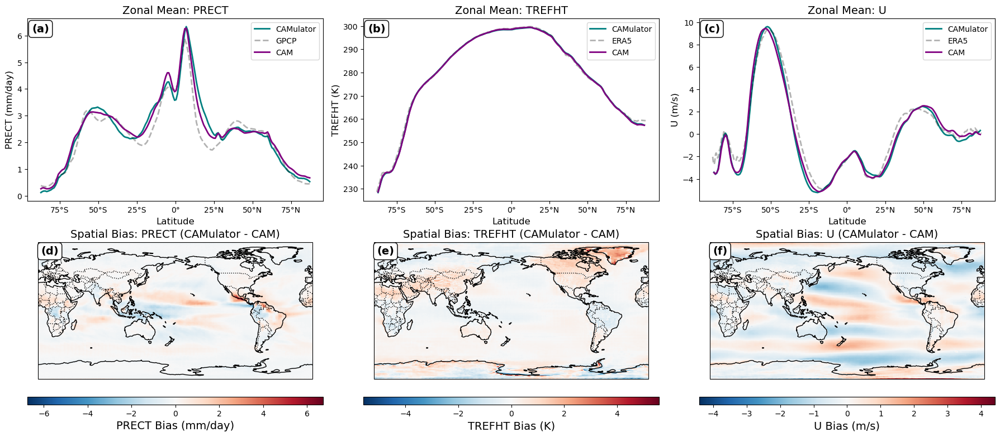

In [5]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Variables and level selection
variables = ['PRECT', 'TREFHT', 'U']
units = ['mm/day', 'K', 'm/s']  # Units for each variable
scaler = [1000*4, 1, 1]  # Scaling factors for variables
level = 31

# Zonal mean and spatial bias calculation
zonal_means = {}
spatial_biases = {}

DDgpcp = xr.open_dataset('/glade/work/wchapman/ADF_obs_Mar2024/GPCP.cam6grid.monthly_climo.1979-2011.nc')['PRECT'].mean('time')

# Iterate over the variables
for i, var in enumerate(variables):
    if var in ['U','V','T','Qtot']:  # 3D variable, select the level first
        zonal_means['DSsm_' + var] = DSsm[var].sel(level=level).mean(dim='longitude')
        zonal_means['DSzarr1_' + var] = DSzarr1_TPm[var].sel(level=level).mean(dim='longitude')
        spatial_biases[var] = DSsm[var].sel(level=level) - DSzarr1_TPm[var].sel(level=level)
    else:  # 2D variables
        zonal_means['DSsm_' + var] = DSsm[var].mean(dim='longitude')
        zonal_means['DSzarr1_' + var] = DSzarr1_TPm[var].mean(dim='longitude')
        spatial_biases[var] = DSsm[var] - DSzarr1_TPm[var]


labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# Plotting
fig = plt.figure(figsize=(18, 8))  # Adjust figure size for smaller top panels
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Top row: Zonal means
for i, var in enumerate(variables):
    ax = plt.subplot(2, 3, i + 1)
    ax.plot(
        DSsm['latitude'].sel(latitude=slice(-88, 88)),
        (zonal_means['DSsm_' + var] * scaler[i]).sel(latitude=slice(-88, 88)),
        label='CAMulator',
        color='teal',
        linewidth=2
    )

    if i ==0:
        DDgpcp = xr.open_dataset('/glade/work/wchapman/ADF_obs_Mar2024/GPCP.cam6grid.monthly_climo.1979-2011.nc')['PRECT'].mean('time')
        ax.plot(DDgpcp['lat'].sel(lat=slice(-88, 88)), DDgpcp.sel(lat=slice(-88, 88)).mean(dim='lon'),
                label='GPCP', linewidth=2, color='k', linestyle='--', alpha=0.3)

    if i==1: 
        DDt2m = xr.open_dataset('/glade/work/wchapman/ADF_obs_Mar2024/TREFHT_ERA5_monthly_climo_197901-202112.nc')['TREFHT'].mean('time')
        ax.plot(DDt2m['lat'].sel(lat=slice(-88, 88)), DDt2m.sel(lat=slice(-88, 88)).mean(dim='lon'),
                label='ERA5', linewidth=2, color='k', linestyle='--', alpha=0.3)

    if i==2:
        DDu = xr.open_dataset('/glade/work/wchapman/ADF_obs_Mar2024/U_ERA5_monthly_climo_197901-202112.nc')['U'].mean('time')
        ax.plot(DDu['lat'].sel(lat=slice(-88, 88)), DDu.sel(lat=slice(-88, 88),lev=975).mean(dim='lon'),
                label='ERA5', linewidth=2, color='k', linestyle='--', alpha=0.3)
                
    ax.plot(
        DSzarr1_TPm['latitude'].sel(latitude=slice(-88, 88)),
        (zonal_means['DSzarr1_' + var] * scaler[i]).sel(latitude=slice(-88, 88)),
        label='CAM',
        color='purple',
        linewidth=2
    )
    ax.set_title(f"Zonal Mean: {var}", fontsize=14)
    ax.set_xlabel("Latitude", fontsize=12)  # Add degree symbol
    ax.set_ylabel(f"{var} ({units[i]})", fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=10)  # Increase label size
    ax.set_xticks([-75, -50, -25, 0, 25, 50, 75])
    ax.set_xticklabels(["75°S", "50°S", "25°S", "0°", "25°N", "50°N", "75°N"], fontsize=10)
    ax.legend(fontsize=10)
    ax.text(0.015, 0.925, labels[i], transform=ax.transAxes, fontsize=14, fontweight='bold',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    
# Bottom row: Spatial biases
for i, var in enumerate(variables):
    ax = plt.subplot(2, 3, i + 4, projection=ccrs.PlateCarree(central_longitude=180))  # Create GeoAxes with central longitude 180
    bias_plot = (spatial_biases[var] * scaler[i]).plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap="RdBu_r",
        add_colorbar=False
    )
    cbar = plt.colorbar(bias_plot, ax=ax, orientation="horizontal", pad=0.1, aspect=40)
    cbar.set_label(f"{var} Bias ({units[i]})", fontsize=14)
    cbar.ax.tick_params(labelsize=10)  # Increase label size
    ax.set_title(f"Spatial Bias: {var} (CAMulator - CAM)", fontsize=14)
    ax.set_facecolor("white")  # Set white background for spatial plots
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    ax.add_feature(cfeature.LAND, edgecolor="black", alpha=0.5)
    ax.text(0.01, 0.91, labels[i + 3], transform=ax.transAxes, fontsize=14, fontweight='bold',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))


plt.tight_layout()
plt.savefig('PRECT_TREFHT_Ulowestlayer_annualbias.png',dpi=250, bbox_inches='tight')
plt.show()


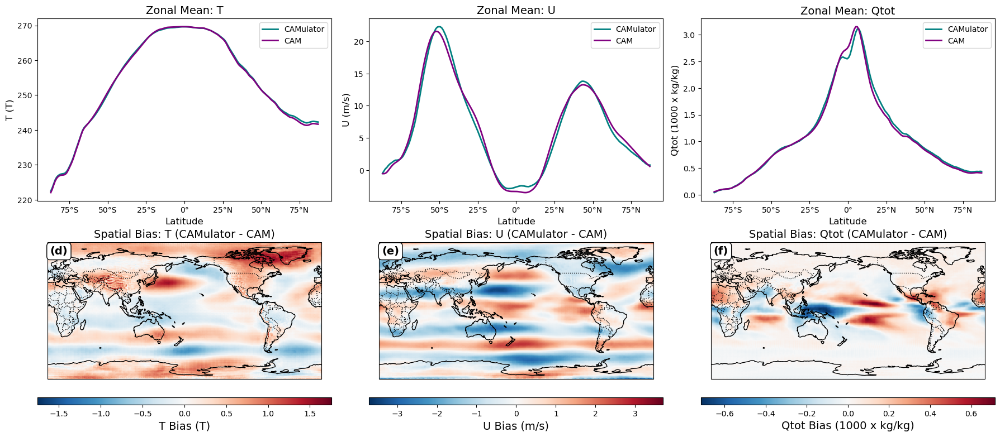

In [6]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Variables and level selection
variables = ['T', 'U', 'Qtot']
units = ['T', 'm/s', '1000 x kg/kg']  # Units for each variable
scaler = [1, 1, 1000]  # Scaling factors for variables
level = 20

# Zonal mean and spatial bias calculation
zonal_means = {}
spatial_biases = {}

# Iterate over the variables
for i, var in enumerate(variables):
    if var in ['U','V','T','Qtot']:  # 3D variable, select the level first
        if var == 'Qtot':
            zonal_means['DSsm_' + var] = DSsm[var].sel(level=level).mean(dim='longitude')
            zonal_means['DSzarr1_' + var] = DSzarr1_TPm[var].sel(level=level).mean(dim='longitude')
            spatial_biases[var] = DSsm[var].sel(level=level) - DSzarr1_TPm[var].sel(level=level)
        else:
            zonal_means['DSsm_' + var] = DSsm[var].sel(level=level).mean(dim='longitude')
            zonal_means['DSzarr1_' + var] = DSzarr1_TPm[var].sel(level=level).mean(dim='longitude')
            spatial_biases[var] = DSsm[var].sel(level=level) - DSzarr1_TPm[var].sel(level=level)

        
    else:  # 2D variables
        zonal_means['DSsm_' + var] = DSsm[var].mean(dim='longitude')
        zonal_means['DSzarr1_' + var] = DSzarr1_TPm[var].mean(dim='longitude')
        spatial_biases[var] = DSsm[var] - DSzarr1_TPm[var]

    ax.text(0.015, 0.925, labels[i], transform=ax.transAxes, fontsize=14, fontweight='bold',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Plotting
fig = plt.figure(figsize=(18, 8))  # Adjust figure size for smaller top panels
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Top row: Zonal means
for i, var in enumerate(variables):
    ax = plt.subplot(2, 3, i + 1)
    ax.plot(
        DSsm['latitude'].sel(latitude=slice(-88, 88)),
        (zonal_means['DSsm_' + var] * scaler[i]).sel(latitude=slice(-88, 88)),
        label='CAMulator',
        color='teal',
        linewidth=2
    )
    ax.plot(
        DSzarr1_TPm['latitude'].sel(latitude=slice(-88, 88)),
        (zonal_means['DSzarr1_' + var] * scaler[i]).sel(latitude=slice(-88, 88)),
        label='CAM',
        color='purple',
        linewidth=2
    )
    ax.set_title(f"Zonal Mean: {var}", fontsize=14)
    ax.set_xlabel("Latitude", fontsize=12)  # Add degree symbol
    ax.set_ylabel(f"{var} ({units[i]})", fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=10)  # Increase label size
    ax.set_xticks([-75, -50, -25, 0, 25, 50, 75])
    ax.set_xticklabels(["75°S", "50°S", "25°S", "0°", "25°N", "50°N", "75°N"], fontsize=10)
    ax.legend(fontsize=10)

# Bottom row: Spatial biases
for i, var in enumerate(variables):
    ax = plt.subplot(2, 3, i + 4, projection=ccrs.PlateCarree(central_longitude=180))  # Create GeoAxes with central longitude 180
    bias_plot = (spatial_biases[var] * scaler[i]).plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap="RdBu_r",
        add_colorbar=False
    )
    cbar = plt.colorbar(bias_plot, ax=ax, orientation="horizontal", pad=0.1, aspect=40)
    cbar.set_label(f"{var} Bias ({units[i]})", fontsize=14)
    cbar.ax.tick_params(labelsize=10)  # Increase label size
    ax.set_title(f"Spatial Bias: {var} (CAMulator - CAM)", fontsize=14)
    ax.set_facecolor("white")  # Set white background for spatial plots
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    ax.add_feature(cfeature.LAND, edgecolor="black", alpha=0.5)
    ax.text(0.01, 0.91, labels[i + 3], transform=ax.transAxes, fontsize=14, fontweight='bold',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))


plt.tight_layout()
plt.savefig('T500_U500_Qtot500_annualbias.png',dpi=250, bbox_inches='tight')
plt.show()


# T2m Seasonal cycle

In [7]:
# Calculate latitude weights (cosine of latitude in radians)
weights = np.cos(np.deg2rad(DSs['latitude']))

# Normalize weights to sum to 1
weights /= weights.sum()

# Apply latitude weighting to the mean
weighted_mean_zarr1 = (DSs['T'].sel(level=31)
                      .resample(time='1D').mean()
                      .weighted(weights)
                      .mean(['longitude', 'latitude']))

weighted_mean1 = (DSzarr1_TP['T'].sel(level=31)
                 .weighted(weights)
                 .mean(['longitude', 'latitude']))

DSs_seas = weighted_mean_zarr1.values
DZs_seas = weighted_mean1.values

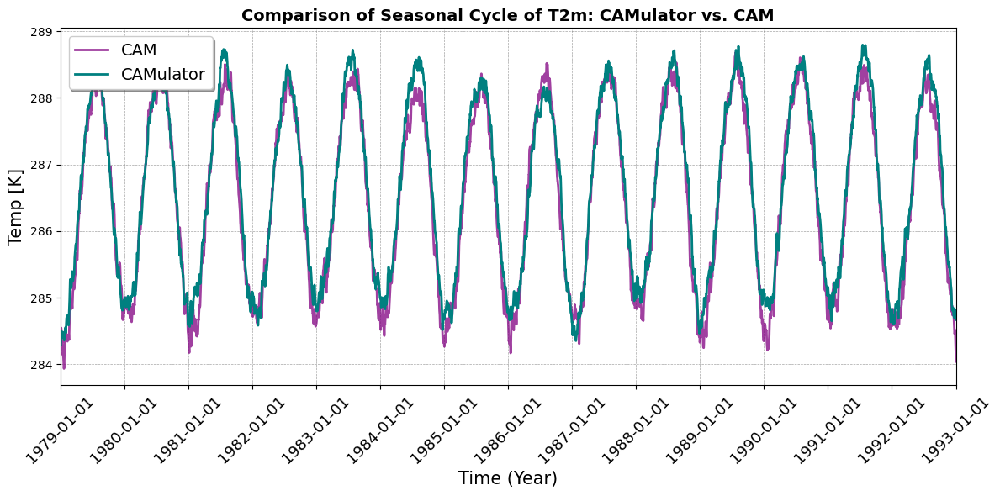

In [8]:
import matplotlib.pyplot as plt

# Convert cftime to datetime
time_converted = [t.strftime('%Y-%m-%d') for t in weighted_mean1['time'].values]

# Extract indices for January 1 of each year
year_ticks = [i for i, t in enumerate(weighted_mean1['time'].values) if t.month == 1 and t.day == 1]

# Create the plot
plt.figure(figsize=(12, 6))  # Larger figure for better visibility

plt.plot(
    time_converted[:7000],
    DZs_seas[:7000],
    label='CAM',
    color='purple',
    linewidth=2,
    alpha=0.75
)

plt.plot(
    time_converted[:7000],
    DSs_seas[:7000],
    label='CAMulator',
    color='teal',
    linewidth=2
)

# Customize x-axis ticks to show years
plt.xticks(
    year_ticks,
    [time_converted[i] for i in year_ticks],
    rotation=45,
    fontsize=13  # Smaller font size for clarity
)

# Adjust x-axis limits and labels
plt.xlim([0, 5110])  # Limit the x-axis range
plt.xlabel("Time (Year)", fontsize=15)
plt.ylabel("Temp [K]", fontsize=15)

# Add legend with improved styling
plt.legend(
    loc='upper left',
    fontsize=14,
    frameon=True,
    fancybox=True,
    shadow=True
)

# Add a title
plt.title("Comparison of Seasonal Cycle of T2m: CAMulator vs. CAM", fontsize=14, fontweight='bold')

# Add grid lines for better readability
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

# Display the plot
plt.tight_layout()  # Adjust layout to avoid clipping
plt.savefig('Annual_Cycle_T2m.png',dpi=250, bbox_inches='tight')
plt.show()


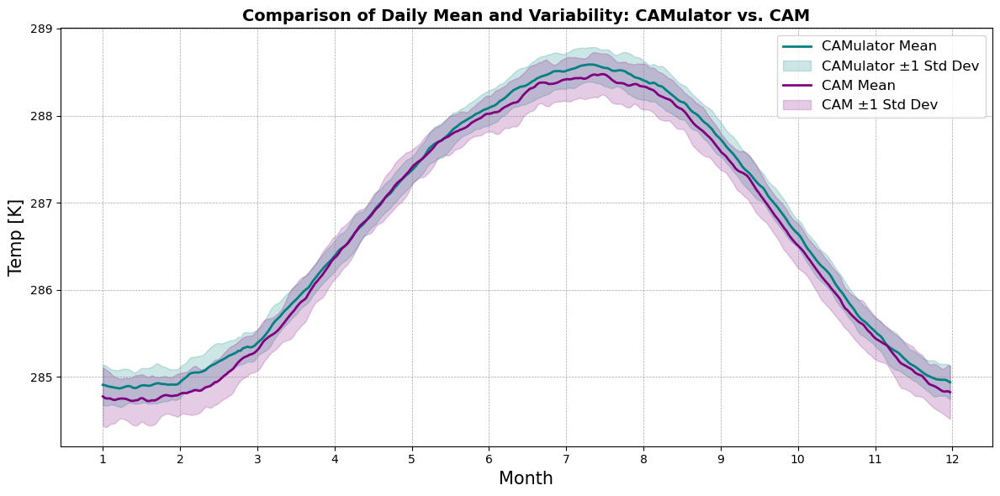

In [9]:

valvals_em = np.zeros([29,364])
valvals_cm = np.zeros([29,364])

count=0
for ee,yryr in enumerate(range(1979,2008)):
    valvals_em[ee,:] = weighted_mean_zarr1.sel(time=str(yryr)).values[:364]
    valvals_cm[ee,:] = weighted_mean1.sel(time=str(yryr)).values[:364]

# Calculate mean and std
mean_em = np.nanmean(valvals_em, axis=0)
mean_cm = np.nanmean(valvals_cm, axis=0)
std_em = np.nanstd(valvals_em, axis=0)
std_cm = np.nanstd(valvals_cm, axis=0)

# X-axis labels for months
months = np.linspace(0, 364, 12)  # Approximate positions for month labels
month_labels = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']

# Plot
plt.figure(figsize=(12, 6))

# CAMulator mean and std
plt.plot(mean_em, color='teal', label='CAMulator Mean', linewidth=2)
plt.fill_between(range(364), mean_em - std_em, mean_em + std_em, color='teal', alpha=0.2, label='CAMulator ±1 Std Dev')

# CAM mean and std
plt.plot(mean_cm, color='purple', label='CAM Mean', linewidth=2)
plt.fill_between(range(364), mean_cm - std_cm, mean_cm + std_cm, color='purple', alpha=0.2, label='CAM ±1 Std Dev')

# Customize x-axis
plt.xticks(months, month_labels)
plt.xlabel("Month", fontsize=15)
plt.ylabel("Temp [K]", fontsize=15)

# Add legend
plt.legend(loc='upper right', fontsize=12, frameon=True)

# Add grid
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

# Title
plt.title("Comparison of Daily Mean and Variability: CAMulator vs. CAM", fontsize=14, fontweight='bold')

# Tight layout and show plot
plt.tight_layout()
plt.savefig('Annual_Cycle_T2m_uncertainty.png',dpi=250, bbox_inches='tight')

plt.show()

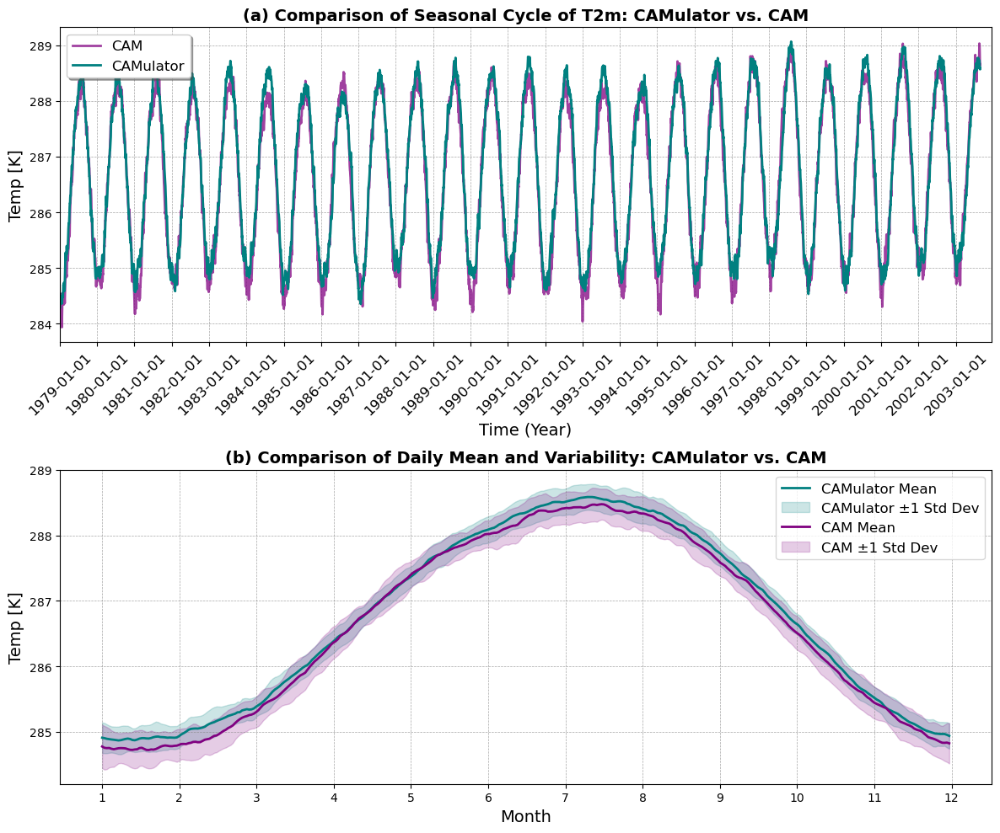

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Convert cftime to datetime for time series plot
time_converted = [t.strftime('%Y-%m-%d') for t in weighted_mean1['time'].values]

# Extract indices for January 1 of each year for x-axis labels
year_ticks = [i for i, t in enumerate(weighted_mean1['time'].values) if t.month == 1 and t.day == 1]

# Prepare seasonal cycle statistics
valvals_em = np.zeros([29, 364])
valvals_cm = np.zeros([29, 364])

count=0
for ee,yryr in enumerate(range(1979,2008)):
    valvals_em[ee,:] = weighted_mean_zarr1.sel(time=str(yryr)).values[:364]
    valvals_cm[ee,:] = weighted_mean1.sel(time=str(yryr)).values[:364]


# Calculate mean and std for seasonal cycle
mean_em = np.nanmean(valvals_em, axis=0)
mean_cm = np.nanmean(valvals_cm, axis=0)
std_em = np.nanstd(valvals_em, axis=0)
std_cm = np.nanstd(valvals_cm, axis=0)

# X-axis labels for months
months = np.linspace(0, 364, 12)  # Approximate positions for month labels
month_labels = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12']

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))  # Two stacked plots

# --- Time Series Plot (Panel a) ---
ax1.plot(
    time_converted[:9000],
    DZs_seas[:9000],
    label='CAM',
    color='purple',
    linewidth=2,
    alpha=0.75
)

ax1.plot(
    time_converted[:9000],
    DSs_seas[:9000],
    label='CAMulator',
    color='teal',
    linewidth=2
)

# Customize x-axis for time series
ax1.set_xticks(year_ticks)
ax1.set_xticklabels([time_converted[i] for i in year_ticks], rotation=45, fontsize=12)
ax1.set_xlim([0, 9110])  # Limit the x-axis range
ax1.set_xlabel("Time (Year)", fontsize=14)
ax1.set_ylabel("Temp [K]", fontsize=14)
ax1.legend(loc='upper left', fontsize=12, frameon=True, fancybox=True, shadow=True)
ax1.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
ax1.set_title("(a) Comparison of Seasonal Cycle of T2m: CAMulator vs. CAM", fontsize=14, fontweight='bold')

# --- Seasonal Cycle Plot (Panel b) ---
ax2.plot(mean_em, color='teal', label='CAMulator Mean', linewidth=2)
ax2.fill_between(range(364), mean_em - std_em, mean_em + std_em, color='teal', alpha=0.2, label='CAMulator ±1 Std Dev')

ax2.plot(mean_cm, color='purple', label='CAM Mean', linewidth=2)
ax2.fill_between(range(364), mean_cm - std_cm, mean_cm + std_cm, color='purple', alpha=0.2, label='CAM ±1 Std Dev')

# Customize x-axis for seasonal cycle
ax2.set_xticks(months)
ax2.set_xticklabels(month_labels)
ax2.set_xlabel("Month", fontsize=14)
ax2.set_ylabel("Temp [K]", fontsize=14)
ax2.legend(loc='upper right', fontsize=12, frameon=True)
ax2.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
ax2.set_title("(b) Comparison of Daily Mean and Variability: CAMulator vs. CAM", fontsize=14, fontweight='bold')

# Adjust layout for better spacing
plt.tight_layout()
plt.savefig('Combined_Annual_Cycle_T2m.png', dpi=250, bbox_inches='tight')

plt.show()


## El Niño Response

1979-12
2004-12
2006-12
1986-12
1994-12
2002-12
1987-12
1991-12
1982-12
1997-12
1983-12
1984-12
2000-12
2005-12
2008-12
1995-12
1988-12
1998-12
1999-12
2007-12
1979-12
2004-12
2006-12
1986-12
1994-12
2002-12
1987-12
1991-12
1982-12
1997-12
1983-12
1984-12
2000-12
2005-12
2008-12
1995-12
1988-12
1998-12
1999-12
2007-12


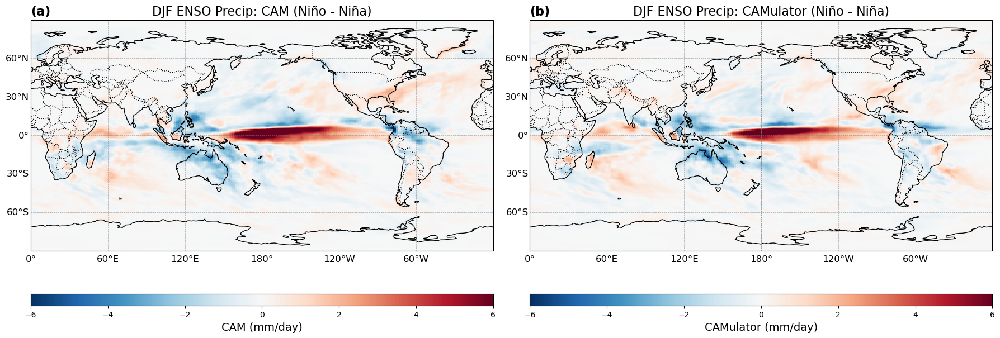

In [6]:
Nino = [1979, 2004, 2006, 1986, 1994, 2002, 1987, 1991, 1982, 1997]
Nina = [1983, 1984, 2000, 2005, 2008, 1995, 1988, 1998, 1999, 2007]


time_index = DSs.get_index("time")
time_index_ce = DSzarr1_TP.get_index("time")

PRECT_nino = np.zeros([len(Nino),192,288])
T2m_nino = np.zeros([len(Nino),192,288])
PRECT_nina = np.zeros([len(Nina),192,288])
T2m_nina = np.zeros([len(Nina),192,288])


for ee, no in enumerate(Nino): 
    yrs_mo = f'{no}-12'
    print(yrs_mo)
    
    # Get the index for the time dimension

    # Find the first matching index for the specific time
    matching_index = time_index.get_loc(yrs_mo).start
    DSs.isel(time=slice(matching_index,matching_index+90))[['PRECT','PS']]

    PRECT_nino[ee,:,:] = DSs.isel(time=slice(matching_index,matching_index+90))['PRECT'].mean('time').values
    T2m_nino[ee,:,:] = DSs.isel(time=slice(matching_index,matching_index+90))['PS'].mean('time').values

for ee, no in enumerate(Nina): 
    yrs_mo = f'{no}-12'
    print(yrs_mo)
    
    # Get the index for the time dimension

    # Find the first matching index for the specific time
    matching_index = time_index.get_loc(yrs_mo).start

    PRECT_nina[ee,:,:] = DSs.isel(time=slice(matching_index,matching_index+90))['PRECT'].mean('time').values
    T2m_nina[ee,:,:] = DSs.isel(time=slice(matching_index,matching_index+90))['PS'].mean('time').values

PRECT_nino_ce = np.zeros([len(Nino),192,288])
T2m_nino_ce = np.zeros([len(Nino),192,288])
PRECT_nina_ce = np.zeros([len(Nina),192,288])
T2m_nina_ce = np.zeros([len(Nina),192,288])

for ee, no in enumerate(Nino): 
    yrs_mo = f'{no}-12'
    print(yrs_mo)
    
    # Get the index for the time dimension

    # Find the first matching index for the specific time
    matching_index = time_index_ce.get_loc(yrs_mo).start
    DSzarr1_TP.isel(time=slice(matching_index,matching_index+90))[['PRECT','PS']]

    PRECT_nino_ce[ee,:,:] = DSzarr1_TP.isel(time=slice(matching_index,matching_index+90))['PRECT'].mean('time').values
    T2m_nino_ce[ee,:,:] = DSzarr1_TP.isel(time=slice(matching_index,matching_index+90))['PS'].mean('time').values

for ee, no in enumerate(Nina): 
    yrs_mo = f'{no}-12'
    print(yrs_mo)
    
    # Get the index for the time dimension

    # Find the first matching index for the specific time
    matching_index = time_index_ce.get_loc(yrs_mo).start

    PRECT_nina_ce[ee,:,:] = DSzarr1_TP.isel(time=slice(matching_index,matching_index+90))['PRECT'].mean('time').values
    T2m_nina_ce[ee,:,:] = DSzarr1_TP.isel(time=slice(matching_index,matching_index+90))['PS'].mean('time').values



# Define spatial biases
spatial_biases = {}
spatial_biases_PS = {}

variables = ['CAM', 'CAMulator']
spatial_biases['CAM'] = np.mean(PRECT_nino_ce * 4000, axis=0) - np.mean(PRECT_nina_ce * 4000, axis=0)
spatial_biases['CAMulator'] = np.mean(PRECT_nino * 4000, axis=0) - np.mean(PRECT_nina * 4000, axis=0)

spatial_biases_PS['CAM'] = np.mean(T2m_nino_ce * 4000, axis=0) - np.mean(T2m_nina_ce * 4000, axis=0)
spatial_biases_PS['CAMulator'] = np.mean(T2m_nino * 4000, axis=0) - np.mean(T2m_nina * 4000, axis=0)


# Assuming DSs contains latitude and longitude arrays
lat = DSs['latitude'].values
lon = DSs['longitude'].values

# Plotting
fig = plt.figure(figsize=(18, 8))
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Spatial biases
for i, var in enumerate(variables):
    ax = plt.subplot(1, 2, i + 1, projection=ccrs.PlateCarree(central_longitude=180))  # Create GeoAxes with central longitude 180
    bias_plot = ax.pcolormesh(
        lon, lat, spatial_biases[var],
        transform=ccrs.PlateCarree(),
        cmap="RdBu_r",
        vmin=-6,
        vmax=6
    )
    cbar = plt.colorbar(bias_plot, ax=ax, orientation="horizontal", pad=0.1, aspect=40)
    cbar.set_label(f"{var} (mm/day)", fontsize=14)
    cbar.ax.tick_params(labelsize=10)  # Increase label size
    ax.set_title(f"DJF ENSO Precip: {var} (Niño - Niña)", fontsize=16)
    ax.set_facecolor("white")  # Set white background for spatial plots
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    ax.add_feature(cfeature.LAND, edgecolor="black", alpha=0.5)

    # Add gridlines and latitude/longitude ticks
    gl = ax.gridlines(draw_labels=True, linestyle="--", linewidth=0.5, color="gray", alpha=0.7)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 12}
    gl.ylabel_style = {"size": 12}
    if i ==0:
        ax.text(0.0, 1.02, "(a)", transform=ax.transAxes, fontsize=16, fontweight="bold")
    if i ==1:
        ax.text(0.0, 1.02, "(b)", transform=ax.transAxes, fontsize=16, fontweight="bold")


plt.tight_layout()
plt.savefig('ENSO_precip.png', dpi=250, bbox_inches='tight')

plt.show()


In [31]:
def spatial_pattern_correlation(da1, da2):
    """
    Compute the cosine-latitude weighted Pearson correlation between two spatial maps.

    Parameters:
        da1, da2: xarray.DataArray
            2D fields (lat x lon) to be compared.

    Returns:
        corr: float
            Weighted spatial correlation coefficient.
    """
    import numpy as np
    import xarray as xr

    # Align datasets and mask to valid (non-NaN) common values
    da1, da2 = xr.align(da1, da2, join='inner')
    mask = da1.notnull() & da2.notnull()

    # Get latitude weights
    weights = np.cos(np.deg2rad(da1['latitude']))
    weights.name = "weights"

    # Apply weights only to valid points
    da1_masked = da1.where(mask)
    da2_masked = da2.where(mask)

    # Weighted mean
    wmean1 = da1_masked.weighted(weights).mean()
    wmean2 = da2_masked.weighted(weights).mean()

    # Anomalies
    anom1 = da1_masked - wmean1
    anom2 = da2_masked - wmean2

    # Weighted covariance and standard deviations
    cov = (anom1 * anom2).weighted(weights).mean()
    std1 = np.sqrt((anom1 ** 2).weighted(weights).mean())
    std2 = np.sqrt((anom2 ** 2).weighted(weights).mean())

    corr = cov / (std1 * std2)
    return corr.item()
spatial_pattern_correlation(ds['cam'].sel(latitude=slice(90,-90)), ds['camulator'].sel(latitude=slice(90,-90)))

0.9347458437401981

## RMSE by Level

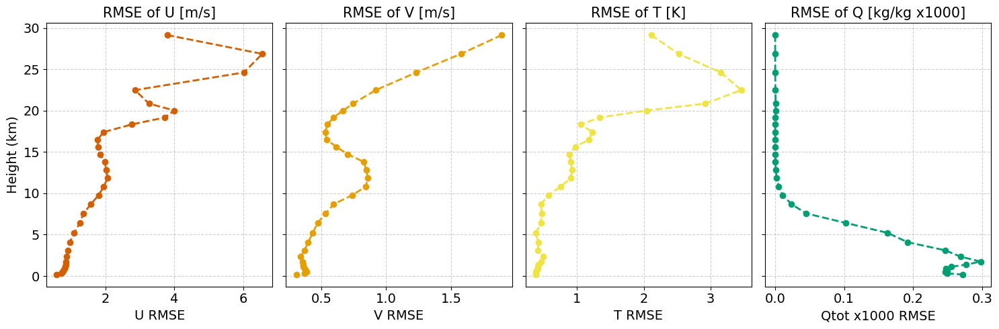

In [19]:
# %%time
# vars = ['U','V','T','Qtot']
# FNS = sorted(glob.glob('/glade/derecho/scratch/wchapman/CREDIT/cesm_wxformer_00191_nb/model_00240/1979-01-01T00Z_OG/1D/averaged_UVTQtotPSPRECTTREFHT*'))
# print('... opening model run ...')
# DSs = xr.open_mfdataset(FNS)
# conc = []
# for yryr in range(1979,2015):
#     print(f'doing {yryr}')
#     DSdo_1 = xr.open_zarr(f'/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/f.e21.CREDIT_climate_{yryr}_ERA5scaled_F32_Qtot.zarr')
#     conc.append(DSdo_1)

# print('... resampling and loading ....')
# DSzarr1 = xr.concat(conc, dim='time')

# # Calculate latitude weights (cosine of latitude in radians)
# weights = np.cos(np.deg2rad(DSs['latitude']))

# # Normalize weights to sum to 1
# weights /= weights.sum()

# # Apply latitude weighting to the mean

# dict_rmse = {}
# mean_dict = {}
# std_dict = {}
# for vv in vars:
#     print(vv)
    
#     # DSzarr1_TP = DSzarr1[vv].resample(time='1D').mean().load()
#     print('... resampled and loaded ....')
    
#     print('... taking mean ...')
#     DSsm = DSs[vv].mean('time').load()
    
#     print('... mean 1  ...')
    
#     DSzarr1_TPm = DSzarr1[vv].mean('time').load()
#     weighted_mean_zarr1 = ((DSzarr1_TPm**2).weighted(weights).mean(['longitude', 'latitude']))
#     weighted_std_zarr1 = ((DSzarr1_TPm).weighted(weights).std(['longitude', 'latitude']))

#     weighted_mean_zarr1['level']=DSsm['level']
#     DSzarr1_TPm['level']=DSsm['level']
    
        
#     print('... mean 2  ...')    
#     dict_rmse[vv] = ((((DSsm-DSzarr1_TPm)**2).weighted(weights).mean(['longitude', 'latitude']))**(0.5)).values
#     mean_dict[vv] = weighted_mean_zarr1.values
#     std_dict[vv] = weighted_std_zarr1.values
#     mean_dict[vv+'_cam'] = DSzarr1_TPm
#     mean_dict[vv+'_ulate'] = DSsm


#figure: 
# Assuming `dict_rmse` and `level` are already defined
variables = ['U', 'V', 'T', 'Qtot']
titles = ['RMSE of U [m/s]', 'RMSE of V [m/s]', 'RMSE of T [K]', 'RMSE of Q [kg/kg x1000]' ]

# Define fall-like colors
colors = ['#D55E00', '#E69F00', '#F0E442', '#009E73']

level = DSzarr1['level'].values
heights = pressure_to_height(level)

# Create a figure and subplots
fig, axes = plt.subplots(nrows=1, ncols=len(variables), figsize=(15, 5), sharey=True)

for ax, var, title, color in zip(axes, variables, titles, colors):
    if var == 'Qtot':
        ax.plot(dict_rmse[var]*1000, heights/1000, color=color, linewidth=2 , linestyle='--', marker='o')  # Thicker lines
        # ax.plot(mean_dict[var]*1000, heights/1000, color=color, linewidth=2 , linestyle='-')  # Thicker lines
        ax.set_xlabel(f'{var} x1000 RMSE',fontsize=14)
        # ax.set_xlim([0,np.max(mean_dict[var])*1000])
    else:
        ax.plot(dict_rmse[var], heights/1000, color=color, linewidth=2 , linestyle='--', marker='o')  # Thicker lines
        # ax.plot(mean_dict[var], heights/1000, color=color, linewidth=2 , linestyle='-')  # Thicker lines
        ax.set_xlabel(f'{var} RMSE',fontsize=14)
        # ax.set_xlim([0,np.max(mean_dict[var])])
    ax.set_title(title,fontsize=15)
    
    ax.grid(True, linestyle='--', alpha=0.6)  # Add grid lines
    ax.invert_yaxis()  # Flip the y-axis
    ax.tick_params(labelsize=14)

# Set common y-axis label
axes[0].set_ylabel('Height (km)',fontsize=14)

plt.tight_layout()
plt.savefig('RMSE_by_level_UVTQ.png', dpi=250, bbox_inches='tight')
plt.show()


In [5]:
%%time
import numpy as np
import xarray as xr
from tqdm import tqdm
import random

# Function to compute RMSE
def compute_rmse(var_name, mean_dict, DS_ymu, weights):
    """Compute the weighted RMSE for a given variable."""
    return (
        (((mean_dict[f'{var_name}_cam'] - DS_ymu[var_name]) ** 2)
         .weighted(weights)
         .mean(['longitude', 'latitude']) ** 0.5)
        .values
    )

# Initialize storage
bedoo = {'U': [], 'V': [], 'T': [], 'Qtot': []}

# Bootstrap loop
for i in tqdm(range(30), desc="Bootstrapping"):
    # Randomly select 5 years
    selected_years = random.sample(range(1979, 2014), 5)

    # Compute mean for the selected years
    DS_ymu = (xr.concat([
        DSzarr1.sel(time=str(year))[['U', 'V', 'T', 'Qtot']].mean('time')
        for year in selected_years
    ], dim="time").mean('time').load())

    DS_ymu['level'] = mean_dict['U_cam']['level']

    # Append RMSE values
    bedoo['U'].append(compute_rmse('U', mean_dict, DS_ymu, weights))
    bedoo['V'].append(compute_rmse('V', mean_dict, DS_ymu, weights))
    bedoo['T'].append(compute_rmse('T', mean_dict, DS_ymu, weights))
    bedoo['Qtot'].append(compute_rmse('Qtot', mean_dict, DS_ymu, weights))

# Convert results to arrays
bedoo = {key: np.array(value) for key, value in bedoo.items()}

#figure: 
# Assuming `dict_rmse` and `level` are already defined
variables = ['U', 'V', 'T', 'Qtot']
titles = ['RMSE of U [m/s]', 'RMSE of V [m/s]', 'RMSE of T [K]', 'RMSE of Q [kg/kg x1000]' ]

# Define fall-like colors
colors = ['#D55E00', '#E69F00', '#F0E442', '#009E73']

level = DSzarr1['level'].values
heights = pressure_to_height(level)

# Create a figure and subplots
fig, axes = plt.subplots(nrows=1, ncols=len(variables), figsize=(15, 5), sharey=True)

for ax, var, title, color in zip(axes, variables, titles, colors):
    if var == 'Qtot':
        ax.plot(bedoo[var].mean(axis=0)*1000, heights/1000, color=color, linewidth=2 , linestyle='--', marker='o')  # Thicker lines
        # ax.plot(mean_dict[var]*1000, heights/1000, color=color, linewidth=2 , linestyle='-')  # Thicker lines
        ax.set_xlabel(f'{var} x1000 RMSE')
        # ax.set_xlim([0,np.max(mean_dict[var])*1000])
    else:
        ax.plot(bedoo[var].mean(axis=0), heights/1000, color=color, linewidth=2 , linestyle='--', marker='o')  # Thicker lines
        # ax.plot(mean_dict[var], heights/1000, color=color, linewidth=2 , linestyle='-')  # Thicker lines
        ax.set_xlabel(f'{var} RMSE')
        # ax.set_xlim([0,np.max(mean_dict[var])])
    ax.set_title(title)
    
    ax.grid(True, linestyle='--', alpha=0.6)  # Add grid lines
    ax.invert_yaxis()  # Flip the y-axis

# Set common y-axis label
axes[0].set_ylabel('Height (km)')
fig.suptitle('Bootstrapped Climatology RMSE')

plt.tight_layout()
plt.show()

## RMSE of all surface vars

In [20]:
%%time
conc = []
for yryr in range(1979,2015):
    print(f'doing {yryr}')
    DSdo_1 = xr.open_zarr(f'/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/f.e21.CREDIT_climate_{yryr}_ERA5scaled_F32_Qtot.zarr')
    conc.append(DSdo_1)

print('... resampling and loading ....')
DSzarr1 = xr.concat(conc, dim='time')
DSzarr1_TP = DSzarr1[['PRECT','CLDTOT','CLDHGH','CLDLOW','CLDMED','TAUX','TAUY','U10','QFLX','FSNS','FLNS','FSNT','FLNT','SHFLX','LHFLX']].resample(time='1D').mean().load()
print('... resampled and loaded ....')

FNS = sorted(glob.glob('/glade/derecho/scratch/wchapman/CREDIT/cesm_wxformer_00191_nb/model_00240/1979-01-02T00Z_OG/1D/averaged_SingleLevel_*'))
print('... opening model run ...')
DSs = xr.open_mfdataset(FNS)
print('... taking mean ...')
DSsm = DSs.mean('time').load()
DSzarr1_TPm = DSzarr1_TP.mean('time').load()
# DSzarr1_TPm['level']=DSsm['level']
# DSzarr1_TP['level']=DSsm['level']

# spatially weighted rmse: 
for vv in ['PRECT','CLDTOT','CLDHGH','CLDLOW','CLDMED','TAUX','TAUY','U10','QFLX','FSNS','FLNS','FSNT','FLNT','SHFLX','LHFLX']: 
   (DSsm[vv] - DSzarr1_TPm[vv])**2

doing 1979
doing 1980
doing 1981
doing 1982
doing 1983
doing 1984
doing 1985
doing 1986
doing 1987
doing 1988
doing 1989
doing 1990
doing 1991
doing 1992
doing 1993
doing 1994
doing 1995
doing 1996
doing 1997
doing 1998
doing 1999
doing 2000
doing 2001
doing 2002
doing 2003
doing 2004
doing 2005
doing 2006
doing 2007
doing 2008
doing 2009
doing 2010
doing 2011
doing 2012
doing 2013
doing 2014
... resampling and loading ....


/glade/work/wchapman/conda-envs/credit/lib/python3.11/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 39.05 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


... resampled and loaded ....
... opening model run ...
... taking mean ...
CPU times: user 6min 28s, sys: 1min 33s, total: 8min 1s
Wall time: 9min 28s


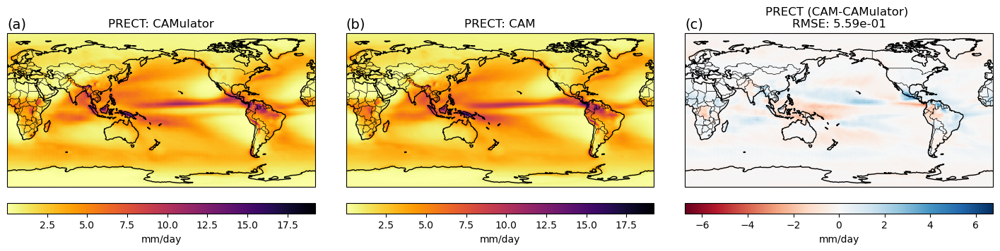

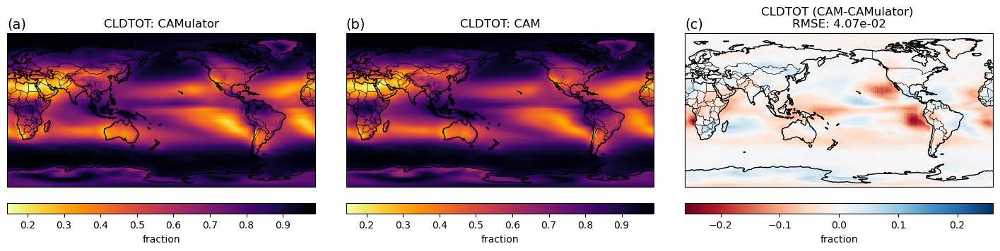

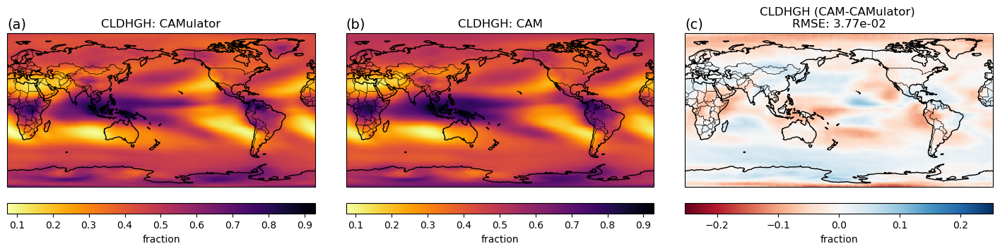

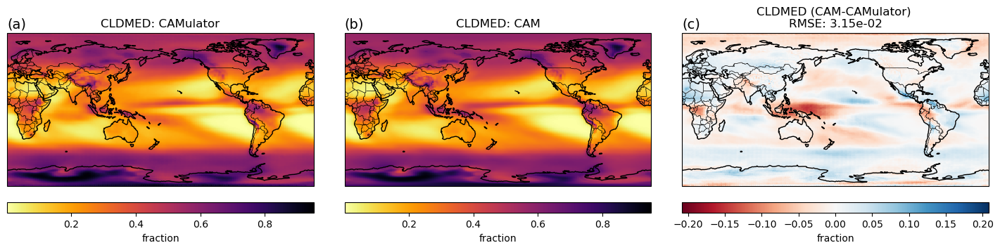

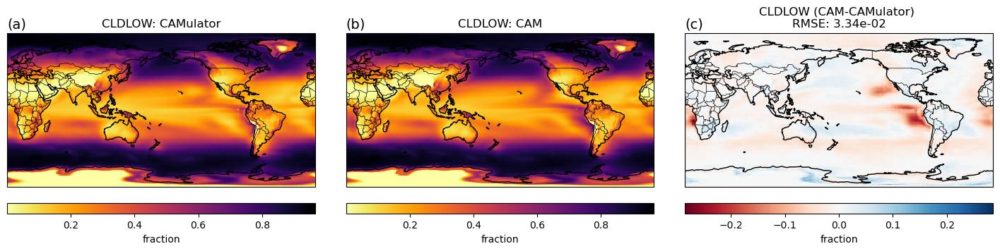

...

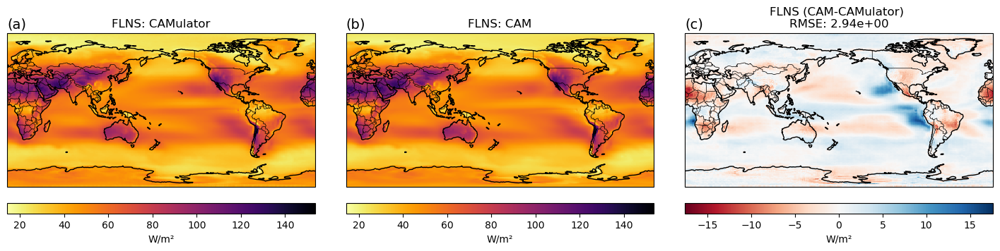

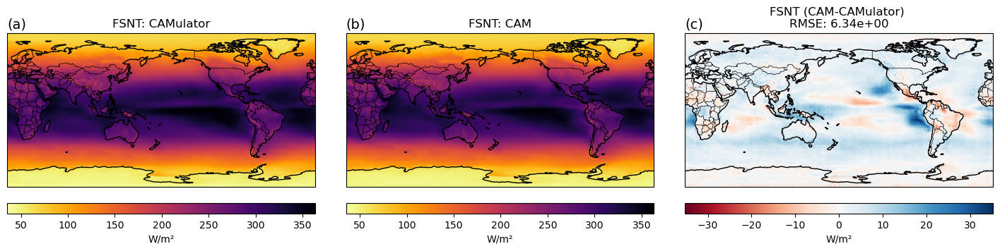

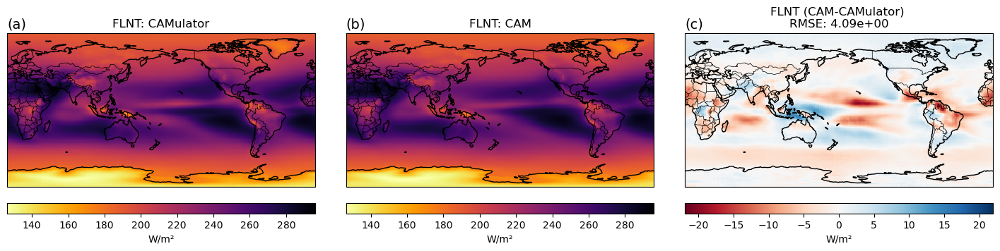

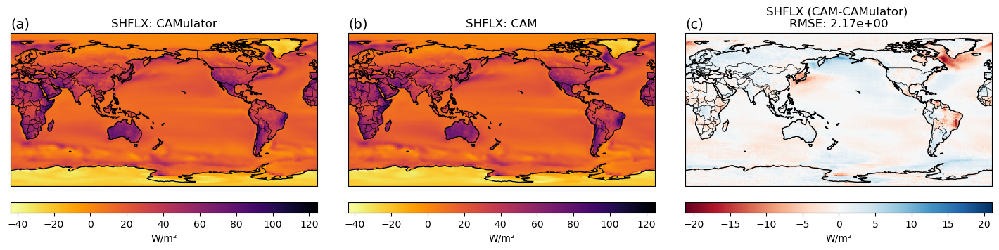

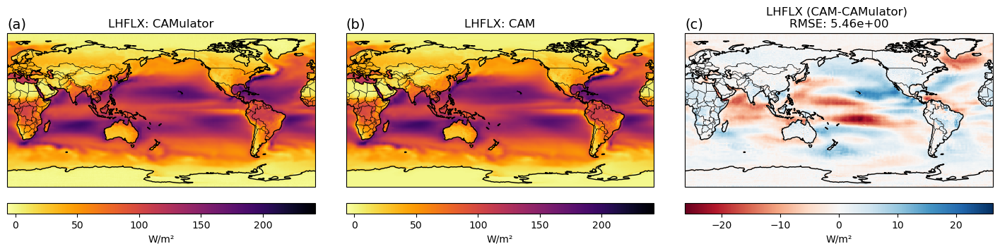

RMSE for all variables: {'PRECT': array(0.55873835), 'CLDTOT': array(0.04070578), 'CLDHGH': array(0.03767445), 'CLDMED': array(0.03152782), 'CLDLOW': array(0.03335255), 'TAUX': array(0.01172839), 'TAUY': array(0.00557304), 'U10': array(0.30825085), 'QFLX': array(0.04705343), 'FSNS': array(6.93668868), 'FLNS': array(2.9436108), 'FSNT': array(6.33930403), 'FLNT': array(4.08912672), 'SHFLX': array(2.16944097), 'LHFLX': array(5.45522238)}
CPU times: user 1min 15s, sys: 4.19 s, total: 1min 19s
Wall time: 1min 15s


2025-02-24 11:16:30,135 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/glade/work/wchapman/conda-envs/credit/lib/python3.11/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/glade/work/wchapman/conda-envs/credit/lib/python3.11/site-packages/distributed/worker.py", line 1252, in heartbeat
    response = await retry_operation(
               ^^^^^^^^^^^^^^^^^^^^^^
  File "/glade/work/wchapman/conda-envs/credit/lib/python3.11/site-packages/distributed/utils_comm.py", line 452, in retry_operation
    return await retry(
           ^^^^^^^^^^^^
  File "/glade/work/wchapman/conda-envs/credit/lib/python3.11/s

In [28]:
%%time
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Calculate latitude weights (cosine of latitude in radians)
weights = np.cos(np.deg2rad(DSsm['latitude']))
weights /= weights.sum()  # Normalize weights to sum to 1

# Function to calculate RMSE
def calculate_rmse(data1, data2, weights):
    """Calculate weighted RMSE for two datasets."""
    return (((data1 - data2) ** 2).weighted(weights).mean(['longitude', 'latitude']) ** 0.5).values

# Initialize dictionary to store RMSE
rmse_dict = {}


# Units dictionary for each variable
variable_units = {
    'PRECT': ['mm/day', 4000],
    'CLDTOT': ['fraction', 1],
    'CLDHGH': ['fraction', 1],
    'CLDLOW': ['fraction', 1],
    'CLDMED': ['fraction', 1],
    'TAUX': ['N/m²', 1],
    'TAUY': ['N/m²', 1],
    'U10':  ['m/s', 1],
    'QFLX': ['kg/m²/s', 1000],
    'FSNS': ['W/m²', 1/21600],
    'FLNS': ['W/m²', -1/21600],
    'FSNT': ['W/m²', 1/21600],
    'FLNT': ['W/m²', -1/21600],
    'SHFLX': ['W/m²', -1/21600],
    'LHFLX': ['W/m²', -1/21600],
}

# Plot settings
def plot_three_panel(variable, ds1, ds2, rmse):
    """Create a three-panel plot with Cartopy."""

    scaler = variable_units.get(variable, 1)[1]
    projection = ccrs.PlateCarree(central_longitude=180)
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': projection})

    # Add coastlines and features
    for ax in axs:
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linewidth=0.5)
        ax.add_feature(cfeature.LAND, edgecolor='black', alpha=0.3)

    # Panel 1: CAMulator
    vmin1, vmax1 = (ds1[variable]*scaler).min().values, (ds1[variable]*scaler).max().values
    im1 = (ds1[variable]*scaler).plot(ax=axs[0], transform=ccrs.PlateCarree(),
                             vmin=vmin1, vmax=vmax1, cmap='inferno_r', add_colorbar=False)
    axs[0].set_title(f"{variable}: CAMulator")

    # Panel 2: CAM
    im2 = (ds2[variable]*scaler).plot(ax=axs[1], transform=ccrs.PlateCarree(),
                             vmin=vmin1, vmax=vmax1, cmap='inferno_r', add_colorbar=False)
    axs[1].set_title(f"{variable}: CAM")

    # Panel 3: Difference
    diff = ds1[variable]*scaler - ds2[variable]*scaler
    max_abs_diff = max(abs(diff.min().values), abs(diff.max().values))
    vmin_diff, vmax_diff = -max_abs_diff, max_abs_diff
    im3 = diff.plot(ax=axs[2], transform=ccrs.PlateCarree(),
                    vmin=vmin_diff, vmax=vmax_diff, cmap='RdBu', add_colorbar=False)
    axs[2].set_title(f"{variable} (CAM-CAMulator) \nRMSE: {rmse:.2e}")

    # Adding labels (a), (b), (c) to panels
    labels = ['(a)', '(b)', '(c)']
    for i, ax in enumerate(axs):
        ax.text(0.0, 1.1, labels[i], transform=ax.transAxes,
                fontsize=14, color='black', va='top', ha='left')
    # Colorbars
    cb1 = fig.colorbar(im1, ax=axs[0], orientation='horizontal', pad=0.05, aspect=30)
    cb1.set_label(f"{variable_units.get(variable, 'Unknown Units')[0]}")

    cb1 = fig.colorbar(im1, ax=axs[1], orientation='horizontal', pad=0.05, aspect=30)
    cb1.set_label(f"{variable_units.get(variable, 'Unknown Units')[0]}")

    cb2 = fig.colorbar(im3, ax=axs[2], orientation='horizontal', pad=0.05, aspect=30)
    cb2.set_label(variable_units.get(variable, 'Unknown Units')[0])

    plt.subplots_adjust(wspace=0.1)  # Increase spacing between subplots
    plt.savefig(f'{variable}_RMSE.png', dpi=250, bbox_inches='tight')
    plt.show()

# Loop through variables and create plots
for vv in ['PRECT', 'CLDTOT', 'CLDHGH', 'CLDMED', 'CLDLOW', 'TAUX', 'TAUY', 'U10', 'QFLX', 'FSNS', 'FLNS', 'FSNT', 'FLNT', 'SHFLX', 'LHFLX']:
    # Calculate RMSE
    scaler = variable_units.get(vv, 1)[1]
    rmse = calculate_rmse(DSsm[vv]*scaler, DSzarr1_TPm[vv]*scaler, weights)
    rmse_dict[vv] = rmse

    # Create three-panel plot
    plot_three_panel(vv, DSsm, DSzarr1_TPm, rmse)

print("RMSE for all variables:", rmse_dict)


## Spectral Variance Loss - 500mb
- This takes a long time

In [30]:
# Get the current client if one exists and close it
try:
    client = get_client()
    client.close()
except ValueError:
    print("No active client found.")

No active client found.


In [2]:
%%time
import time

run_cell=False

if run_cell:
    DSera5 = xr.open_dataset('./spat_grid.nc')
    
    conc = []
    verif_results = []
    
    for yryr in range(1979,2015):
        
        path_verif = f'./zes_{yryr}'
    
        print(f'doing {yryr}')
        DSdo_1 = xr.open_zarr(f'/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/f.e21.CREDIT_climate_{yryr}_ERA5scaled_F32_Qtot.zarr')
        # conc.append(DSdo_1)
        
    
        DScesm = DSdo_1[['T','U','V']].isel(level=20).load()
        DScesm['theta'] = DScesm['T'] * (1000/524.7)**(287.0/1004)
        
        source_grid = regridding.Grid.from_degrees(DScesm.longitude.values,DScesm.latitude.values)
        target_grid = regridding.Grid.from_degrees(DSera5.longitude.values,DSera5.latitude[::-1].values)
        REg = regridding.ConservativeRegridder(source_grid,target_grid)
        
        DA = REg.regrid_dataset(DScesm)
        DA = DA.assign_coords(latitude=DSera5.latitude[::-1].values)
        DA = DA.assign_coords(longitude=DSera5.longitude.values)
        DA = DA.transpose("time", "latitude", "longitude")
        zes_temp = []
        for var in ['U', 'V', 'theta']:
            zes = zonal_energy_spectrum_sph(DA, var, grid_type='GLQ')
            zes_temp.append(zes)
            
        verif_results.append(xr.merge(zes_temp))
    
    ds_verif = xr.concat(verif_results, dim='time')
    ds_verif['KE'] = 0.5*(ds_verif['V']+ds_verif['U'])
    ds_verif_means = ds_verif.mean('time')
    
    def preprocess(ds):
        """
        Preprocess the dataset by selecting specific variables and a specific level.
        """
        return ds[['T', 'U', 'V']].isel(level=20)
    
    
    print('CAMulator') 
    DSdt = xr.open_dataset('/glade/derecho/scratch/wchapman/CREDIT/cesm_wxformer_00191_nb/model_00240/1979-01-01T00Z/datetimes_in_files.nc')
    client = Client()
    print(f"Dask dashboard available at: {client.dashboard_link}")
    time.sleep(19)  # Sleeps for 1 second
    
    verif_results_em = []
    for yryr in range(1979,2009):
        print(yryr)
        yryrstr = str(yryr)
        DS_indy = DSdt.sel(time=yryrstr)['index'].values
        FNS = sorted(glob.glob('/glade/derecho/scratch/wchapman/CREDIT/cesm_wxformer_00191_nb/model_00240/1979-01-01T00Z/pred_*.nc'))
        # Ensure DS_indy contains integers
        DS_indy = DS_indy.astype(int)
        
        # Validate indices (optional, but good practice)
        max_index = len(FNS) - 1
        if np.any(DS_indy > max_index) or np.any(DS_indy < 0):
            raise ValueError("Indices in DS_indy are out of bounds for the FNS list.")
        
        # Select files using DS_indy
        selected_files = [FNS[i] for i in DS_indy]
        #this is roughly 1450 files... 
    
        # DScesm = xr.open_mfdataset(selected_files)[['T','U','V']].isel(level=20)
    
        batch_size=100
        batches = [selected_files[i:i + batch_size] for i in range(0, len(selected_files), batch_size)]
            
        datasets = []
        for batch in batches:
            # Open each batch with preprocessing and optimizations
            DS_batch = xr.open_mfdataset(
                batch,  
                preprocess=preprocess, 
                parallel=True, 
                chunks={'time': 100}
            )
            datasets.append(DS_batch)
        DScesm = xr.concat(datasets, dim='time')
        DScesm = DScesm.load()
        print('opened')
    
        DScesm['theta'] = DScesm['T'] * (1000/524.7)**(287.0/1004)
        
        source_grid = regridding.Grid.from_degrees(DScesm.longitude.values,DScesm.latitude.values)
        target_grid = regridding.Grid.from_degrees(DSera5.longitude.values,DSera5.latitude[::-1].values)
        REg = regridding.ConservativeRegridder(source_grid,target_grid)
        
        DA = REg.regrid_dataset(DScesm)
        DA = DA.assign_coords(latitude=DSera5.latitude[::-1].values)
        DA = DA.assign_coords(longitude=DSera5.longitude.values)
        DA = DA.transpose("time", "latitude", "longitude")
    
        zes_temp_em = []
        for var in ['U', 'V', 'theta']:
            zes = zonal_energy_spectrum_sph(DA, var, grid_type='GLQ')
            zes_temp_em.append(zes)
            
        verif_results_em.append(xr.merge(zes_temp_em))
        
    
    ds_verif_em = xr.concat(verif_results_em, dim='time')
    ds_verif_em['KE'] = 0.5*(ds_verif_em['V']+ds_verif_em['U'])
    ds_verif_means_em = ds_verif_em.mean('time')
    
    # Get the current client if one exists and close it
    try:
        client = get_client()
        client.close()
    except ValueError:
        print("No active client found.")
else:
    ds_verif_em = xr.open_dataset('./model_em_wavenumber.nc')
    ds_verif_em['KE'] = 0.5*(ds_verif_em['V']+ds_verif_em['U'])
    ds_verif_means_em = ds_verif_em.mean('time')

    ds_verif = xr.open_dataset('./cesm_em_wavenumber.nc')
    ds_verif['KE'] = 0.5*(ds_verif['V']+ds_verif['U'])
    ds_verif_means = ds_verif.mean('time')

CPU times: user 373 ms, sys: 157 ms, total: 529 ms
Wall time: 2.67 s


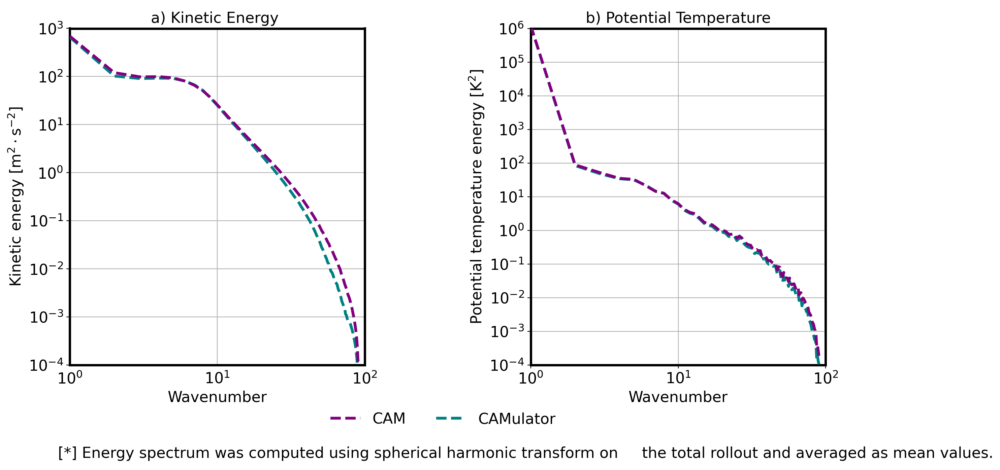

In [8]:
import matplotlib.gridspec as gridspec
import graph_utils as gu
import matplotlib.lines as mlines

def no_decimals(x, pos):
    return f'{int(x)}'
dpi_ = 200
# # color specs
# my_colors = gu.ksha_color_set_summon(color_set=0)
# colors_main = [my_colors['blue'], my_colors['orange'], my_colors['red'], [0.4, 0, 0]]

# line specs
line_keys = {}
line_keys['CAM'] = {'linewidth': 3, 'linestyle': '--', 'color': 'purple', 'alpha': 1, 'zorder': 4, 'label': ''}
line_keys['CAMulator'] = {'linewidth': 3, 'linestyle': '--', 'color': 'teal', 'alpha': 1, 'zorder': 3, 'label': ''}

# labeling specs
wavenum = np.arange(1, len(np.array(ds_verif_means['KE']))+1)
k0 = 6
k1 = 45
model_names = ['CAM', 'CAMulator']
ds_name = [ds_verif_means, ds_verif_means_em] 
varnames_plot = ['KE', 'theta']

titles = ['a) Kinetic Energy ', 'b) Potential Temperature',]
lead_names = [99999]
legned_labels = ['CAM', 'CAMulator']

handles = []
h_ratios = [1]  # Single row
w_ratios = [1, 0.25, 1, 0.25]  # Adjusted for two main plots side by side

fig = plt.figure(figsize=(13, 5), dpi=dpi_)  # Adjust height for single row
gs = gridspec.GridSpec(len(h_ratios), len(w_ratios),
                       height_ratios=h_ratios, width_ratios=w_ratios)

ind_x = [0]  # Single row
ind_y = [0, 2]  # Two columns for side-by-side layout

AX = np.zeros((len(ind_x), len(ind_y)), dtype=object)
AX_flat = []

# Create main axes
for ix, ix_gs in enumerate(ind_x):
    for iy, iy_gs in enumerate(ind_y):
        ax_main = plt.subplot(gs[ix_gs, iy_gs])
        AX[ix][iy] = ax_main
        AX_flat.append(ax_main)

plt.subplots_adjust(0, 0, 1, 1, hspace=0.0, wspace=0.25)  # Add horizontal space

# Configure all axes in AX_flat
for ax in AX_flat:
    ax = gu.ax_decorate_box(ax)
    
# Set x-tick labels for the bottom row
for iy in range(len(ind_y)):
    AX[0][iy].tick_params(labelbottom=True, labelsize=16)

# Configure left y-axis formatting
for ix in range(len(ind_x)):
    for iy in range(len(ind_y)):
        ax = AX[ix][iy]
        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.grid(':', axis='y')
        ax.grid(':', axis='x')
        ax.set_xlim([wavenum[0], wavenum[-1]+10])
        ax.tick_params(labelsize=16, left=True, labelleft=True)
        if iy == 0:
            ax.set_ylim([1e-4, 1e3])
            ax.tick_params(bottom=False)
        else:
            ax.set_ylim([1e-4, 1e6])
            ax.tick_params(bottom=True)

AX[0][0].set_ylabel('Kinetic energy [$\mathsf{m^2\cdot s^{-2}}$]', fontsize=16)
AX[0][1].set_ylabel('Potential temperature energy [$\mathsf{K^2}$]', fontsize=16)
AX[0][0].set_xlabel('Wavenumber', fontsize=16)
AX[0][1].set_xlabel('Wavenumber', fontsize=16)
# AX[0][0].text(0.48, 0.47, '$\mathsf{K^{-3}}$', fontsize=15, ha='center', va='center', 
#               transform=AX[0][0].transAxes, bbox=dict(facecolor='0.95', edgecolor='none'))

# AX[0][0].text(0.92, 0.76, '$\mathsf{K^{-5/3}}$', fontsize=15, ha='center', va='center', 
#               transform=AX[0][0].transAxes, bbox=dict(facecolor='w', edgecolor='none'))

# AX[0][0].text(0.55, 0.49, '[**]', fontsize=10, ha='center', va='center', 
#               transform=AX[0][0].transAxes)

for ix, lead in enumerate(lead_names):
    for iy, var in enumerate(varnames_plot):
        for i_model, model_name in enumerate(['CAM', 'CAMulator']):
            AX[0][iy].plot(wavenum, ds_name[i_model][var].values, 
                                  **line_keys['{}'.format(model_name)])
            # if iy < 3:
            #     AX[ix][iy].plot(wavenum, PLOT_data_1h['ZES_{}_{}_{}'.format('wxformer', lead, var)], 
            #                 **line_keys['wxformer_1h'])
                
            # AX[ix][iy].axvspan(xmin=k0, xmax=k1, color='0.95', zorder=1)
            # AX[ix][iy].axvline(x=k0, color='k', linestyle='--', linewidth=2)
            # AX[ix][iy].axvline(x=k1, color='k', linestyle='--', linewidth=2)
            
        # AX[ix][iy].plot(wavenum, PLOT_data['ZES_ERA5_{}'.format(var)], **line_keys['ERA5'])
        # title
        AX[ix][iy].set_title(titles[3*ix+iy], fontsize=16)


handle_legneds1 = []
handle_legneds1.append(mlines.Line2D([], [], **line_keys['CAM']))
handle_legneds1.append(mlines.Line2D([], [], **line_keys['CAMulator']))

ax_lg1 = fig.add_axes([0.27, -0.15, .3, 0.05])
LG1 = ax_lg1.legend(handle_legneds1, legned_labels, 
                    bbox_to_anchor=(1, 1), ncol=5, prop={'size':16})

ax_title1 = fig.add_axes([0.0, 1.035, 1.0, 0.03])
title_len = 0.6
fontsize_list = [16,]*13
fontweight_list = ['normal', 'bold', 'normal', 'bold', 'normal', 'bold', 'normal']

ax_title2 = fig.add_axes([0.0, 0.49, 1.0, 0.03])
title_len = 0.465
fontsize_list = [16,]*10
fontweight_list = ['normal', 'bold', 'normal', 'bold', 'normal', 'bold', 'normal']

w_p1 = '[*] Energy spectrum was computed using spherical harmonic transform on'
w_p2 = '     the total rollout and averaged as mean values.'
ax_words1 = fig.add_axes([0, -0.2925, 0.75, 0.05])
ax_words1.text(-0.018, 1, w_p1+w_p2, ha='left', va='top', fontsize=16, transform=ax_words1.transAxes);

LG1 = gu.lg_box(LG1)
ax_lg1.set_axis_off()
ax_title1.set_axis_off()
ax_title2.set_axis_off()
ax_words1.set_axis_off()
ax_words2.set_axis_off()
plt.savefig('Spectra_WVsp.png',dpi=250, bbox_inches='tight')
plt.show()

## Rate at which we diverge from obs vs. rate at which ensembles diverge

## Look at the Trend